![Imgur](https://i.imgur.com/5rtbtpN.png)

# Data Overview

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 300
plt.rcParams["axes.spines.right"] = False
plt.rcParams["axes.spines.top"] = False
plt.rcParams["figure.figsize"] = (4.5, 3.5)

penguin_dataset = pd.read_csv("../../data/01_raw/palmerpenguins_extended.csv")
df = penguin_dataset.copy()

df

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,diet,life_stage,health_metrics,year
0,Adelie,Biscoe,53.4,17.8,219.0,5687.0,female,fish,adult,overweight,2021
1,Adelie,Biscoe,49.3,18.1,245.0,6811.0,female,fish,adult,overweight,2021
2,Adelie,Biscoe,55.7,16.6,226.0,5388.0,female,fish,adult,overweight,2021
3,Adelie,Biscoe,38.0,15.6,221.0,6262.0,female,fish,adult,overweight,2021
4,Adelie,Biscoe,60.7,17.9,177.0,4811.0,female,fish,juvenile,overweight,2021
...,...,...,...,...,...,...,...,...,...,...,...
3425,Gentoo,Biscoe,44.0,20.4,252.0,6447.0,male,squid,adult,healthy,2025
3426,Gentoo,Biscoe,54.5,25.2,245.0,6872.0,male,squid,adult,healthy,2025
3427,Gentoo,Biscoe,51.4,20.4,258.0,7409.0,male,squid,adult,overweight,2025
3428,Gentoo,Biscoe,55.9,20.5,247.0,6491.0,male,squid,adult,healthy,2025


# Univariate Analysis

# 　Descriptive Statistics

In [3]:
df[['bill_length_mm', 'bill_depth_mm', 'flipper_length_mm', 'body_mass_g']].describe().round(1)

,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g
count,3430.0,3430.0,3430.0,3430.0
mean,38.5,18.4,207.0,4834.7
std,13.2,2.8,28.9,1311.1
min,13.6,9.1,140.0,2477.0
25%,28.9,16.6,185.0,3843.5
50%,34.5,18.4,203.0,4633.5
75%,46.6,20.3,226.0,5622.0
max,88.2,27.9,308.0,10549.0


# 　Frequency Table

In [4]:
df[['species','sex','diet','life_stage']].value_counts().reset_index(name='count')

,species,sex,diet,life_stage,count
0,Adelie,female,krill,juvenile,236
1,Adelie,male,krill,juvenile,231
2,Adelie,male,parental,chick,211
3,Adelie,female,parental,chick,207
4,Gentoo,male,parental,chick,155
5,Gentoo,male,krill,juvenile,150
6,Gentoo,female,parental,chick,137
7,Gentoo,female,krill,juvenile,134
8,Chinstrap,female,krill,juvenile,130
9,Gentoo,male,fish,adult,129


# Bivariate Analysis

# 　Species-wise

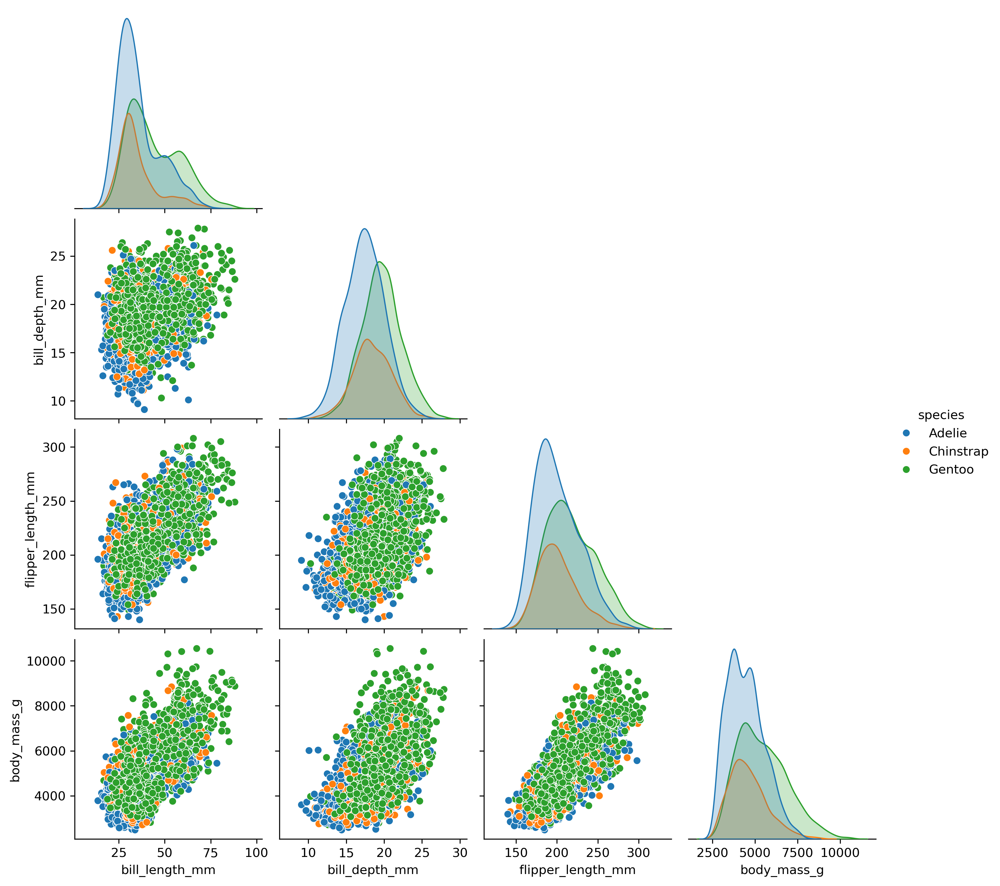

In [5]:
selected_columns = df[['species','bill_length_mm', 'bill_depth_mm', 'flipper_length_mm', 'body_mass_g']]
sns.pairplot(selected_columns, corner=True, hue='species')
plt.show()

## Pivot Table

In [6]:
pivot_table_result = pd.pivot_table(df,
                                    values=['bill_length_mm', 'bill_depth_mm', 'flipper_length_mm', 'body_mass_g'],
                                    index=['species'],
                                    aggfunc='mean')  # You can change 'mean' to other functions like 'sum', 'max', etc.

print(pivot_table_result.round(1))

           bill_depth_mm  bill_length_mm  body_mass_g  flipper_length_mm
species                                                                 
Adelie              17.5            35.4       4445.5              200.8
Chinstrap           18.4            35.0       4602.5              201.7
Gentoo              19.7            44.2       5437.6              217.5


The pivot table shows distinct characteristics across the Adelie, Chinstrap, and Gentoo species in terms of bill depth, bill length, body mass, and flipper length.

- **Gentoo**: Lead in all categories, having the deepest bills, longest bills, highest body mass, and longest flippers.
  
- **Chinstrap**: Generally heavier than Adelie but similar in other aspects.
  
- **Adelie**: Smallest in all metrics, very closely related to Chinstrap except for a slightly lower body mass.

In summary, Gentoo penguins are generally larger, while Adelie and Chinstrap are more similar to each other but differ slightly in body mass. These traits could serve as distinguishing features in ecological studies or machine learning models.

# 　Sex-wise

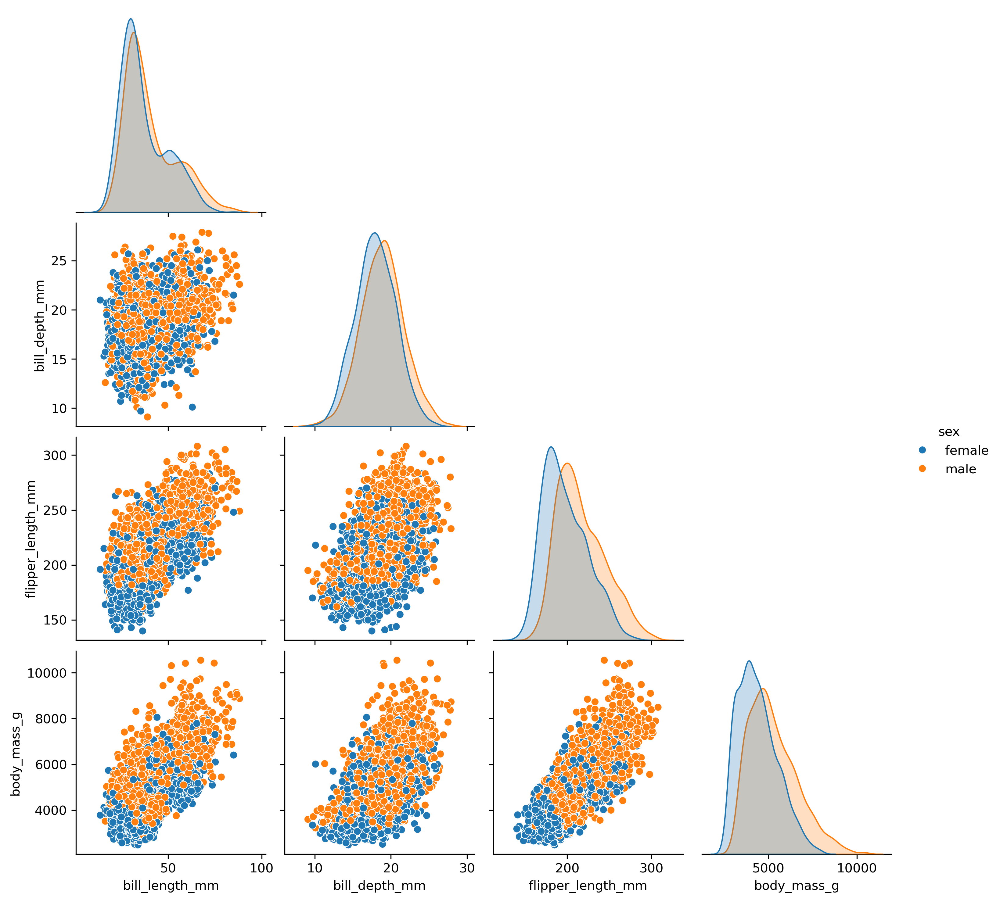

In [7]:
selected_columns = df[['sex','bill_length_mm', 'bill_depth_mm', 'flipper_length_mm', 'body_mass_g']]
sns.pairplot(selected_columns, corner=True, hue='sex')
plt.show()

## Pivot Table

In [8]:
pivot_table_result = pd.pivot_table(df,
                                    values=['bill_length_mm', 'bill_depth_mm', 'flipper_length_mm', 'body_mass_g'],
                                    index=['sex'],
                                    aggfunc='mean')  # You can change 'mean' to other functions like 'sum', 'max', etc.

pivot_table_result.round(1)

,bill_depth_mm,bill_length_mm,body_mass_g,flipper_length_mm
sex,,,,
female,18.0,36.9,4396.5,197.6
male,18.9,40.2,5278.6,216.6


The table shows noticeable differences between female and male penguins in terms of bill depth, bill length, body mass, and flipper length:

- **Male Penguins**: Generally larger in all metrics, including deeper and longer bills, higher body mass, and longer flippers.

- **Female Penguins**: Have smaller dimensions across the board, with shallower and shorter bills, lower body mass, and shorter flippers.

These observations indicate sexual dimorphism in the penguin populations studied. The males are noticeably larger, suggesting that these metrics can be important features to distinguish between sexes in biological or machine learning studies.


# 　Life-stage Wise

/opt/conda/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


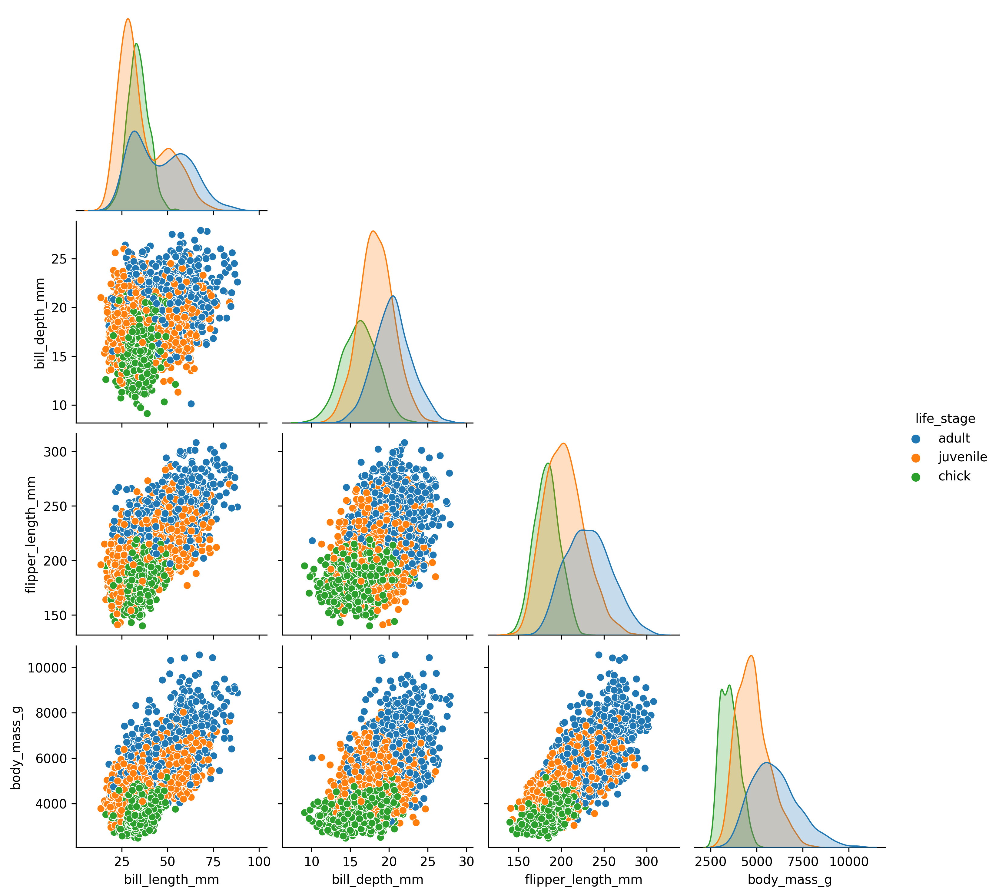

In [8]:
selected_columns = df[['life_stage','bill_length_mm', 'bill_depth_mm', 'flipper_length_mm', 'body_mass_g']]
sns.pairplot(selected_columns, corner=True, hue='life_stage')
plt.show()

## Pivot Table

In [9]:
pivot_table_result = pd.pivot_table(df,
                                    values=['bill_length_mm', 'bill_depth_mm', 'flipper_length_mm', 'body_mass_g'],
                                    index=['life_stage'],
                                    aggfunc='mean')  # You can change 'mean' to other functions like 'sum', 'max', etc.

pivot_table_result.round(1)

,bill_depth_mm,bill_length_mm,body_mass_g,flipper_length_mm
life_stage,,,,
adult,20.5,46.1,5986.5,232.1
chick,16.2,33.9,3530.9,183.0
juvenile,18.3,36.1,4793.2,203.7


The table provides insights into how penguin metrics differ across life stages:

- **Adult Penguins**: Display the highest values for each attribute—deepest bills, longest bills, greatest body mass, and longest flippers.

- **Juvenile Penguins**: Fall in between adults and chicks in terms of all attributes, showing a transitional stage in their development.

- **Chick Penguins**: Possess the lowest measurements across all attributes, reflecting their early stage in life.

The metrics correlate well with the life stage of the penguins, marking a clear progression from chick to juvenile to adult in terms of size and mass. This suggests that these physical attributes could serve as indicators of life stage in biological studies or machine learning models.

# 　Diet-wise

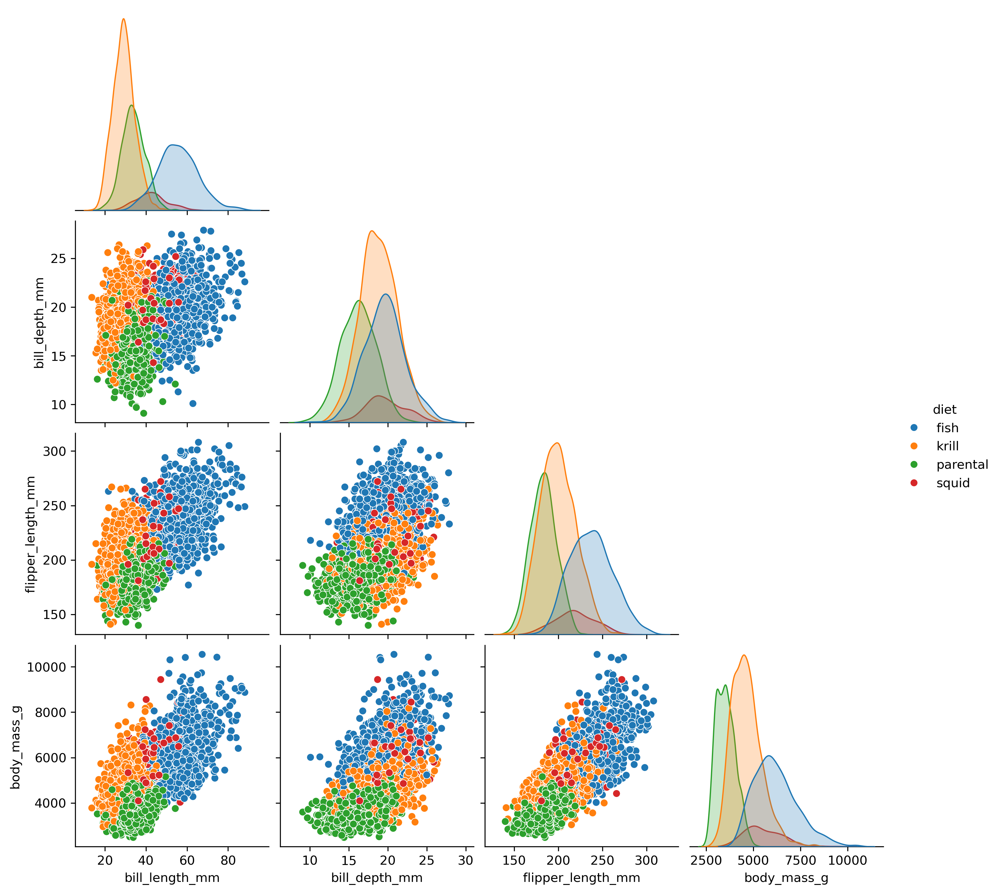

In [10]:
selected_columns = df[['diet','bill_length_mm', 'bill_depth_mm', 'flipper_length_mm', 'body_mass_g']]
sns.pairplot(selected_columns, corner=True, hue='diet')
plt.show()

## Pivot Table

In [11]:
pivot_table_result = pd.pivot_table(df,
                                    values=['bill_length_mm', 'bill_depth_mm', 'flipper_length_mm', 'body_mass_g'],
                                    index=['diet'],
                                    aggfunc='mean')  # You can change 'mean' to other functions like 'sum', 'max', etc.

pivot_table_result.round(1)

,bill_depth_mm,bill_length_mm,body_mass_g,flipper_length_mm
diet,,,,
fish,19.6,55.6,6173.4,237.4
krill,18.8,29.2,4627.9,199.5
parental,16.2,33.9,3530.9,183.0
squid,19.7,42.7,5520.3,218.6


The table shows how different diets are associated with variations in penguin physical attributes:

- **Fish Diet**: Penguins on a fish diet exhibit the largest metrics across all attributes. They have the deepest and longest bills, highest body mass, and longest flippers.

- **Krill Diet**: Penguins consuming krill have smaller measurements for all attributes when compared to those on a fish diet, but are notably larger than chicks that are fed by their parents.

- **Parental Diet**: Penguins still reliant on parental feeding (likely chicks) show the lowest values across all physical attributes.

- **Squid Diet**: Penguins on a squid diet display attributes that are generally higher than those on a krill diet but lower than those on a fish diet, indicating a middle-ground nutritional value of squid.

The data suggests that diet plays a significant role in the physical development of penguins, offering valuable insights for ecological studies and predictive modeling.


# 　Year-wise

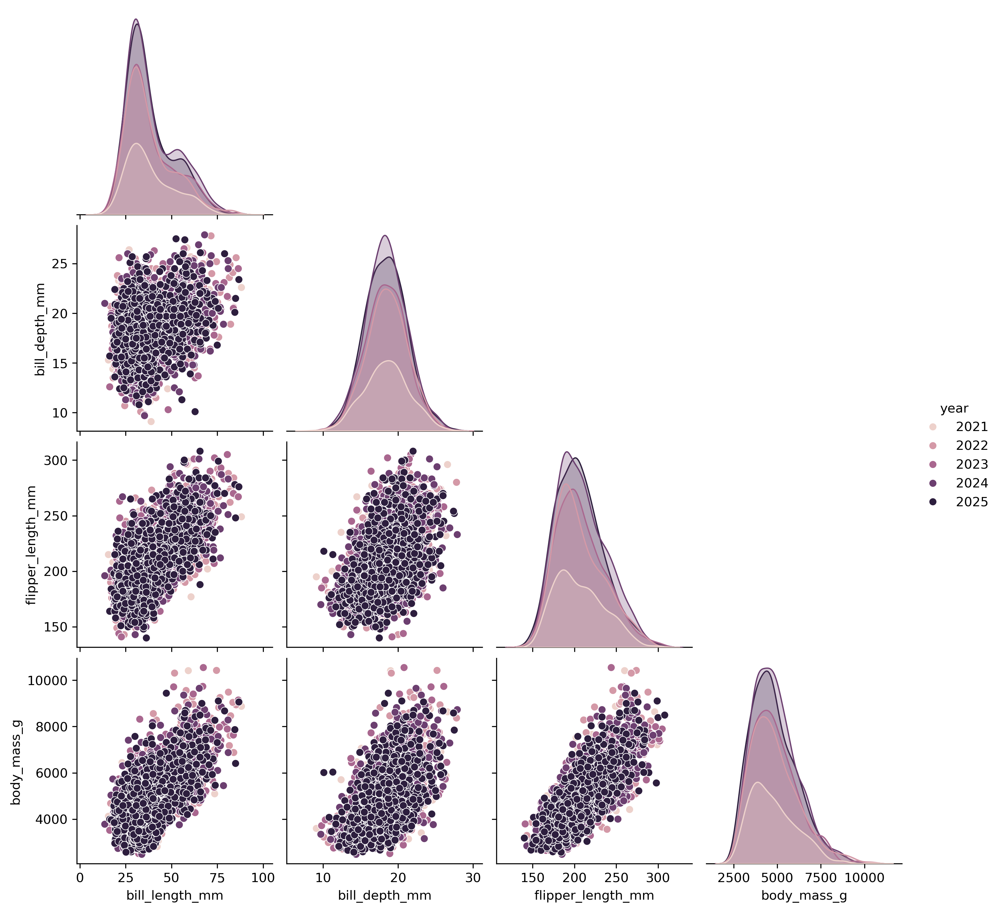

In [12]:
selected_columns = df[['year','bill_length_mm', 'bill_depth_mm', 'flipper_length_mm', 'body_mass_g']]
sns.pairplot(selected_columns, corner=True, hue='year')
plt.show()

## Pivot Table

In [13]:
pivot_table_result = pd.pivot_table(df,
                                    values=['bill_length_mm', 'bill_depth_mm', 'flipper_length_mm', 'body_mass_g'],
                                    index=['year'],
                                    aggfunc='mean')  # You can change 'mean' to other functions like 'sum', 'max', etc.

pivot_table_result.round(1)

,bill_depth_mm,bill_length_mm,body_mass_g,flipper_length_mm
year,,,,
2021,18.5,38.6,4780.2,206.2
2022,18.6,38.0,4863.1,206.4
2023,18.4,38.4,4833.1,207.2
2024,18.4,39.3,4874.8,208.4
2025,18.4,38.2,4795.3,206.2


The table provides insights into the subtle yearly variations in penguin attributes:

- **Bill Depth**: Remains relatively stable across years, ranging from 18.4 to 18.6 mm.
  
- **Bill Length**: Also exhibits minimal fluctuation, with a slightly increased length noted in 2024.

- **Body Mass**: Shows a general increase from 2021 to 2024, followed by a slight decrease in 2025.

- **Flipper Length**: Incrementally increases from 2021 to 2024, but reverts to the 2021 length in 2025.

Overall, while there are slight fluctuations in penguin attributes over the years, the changes are not substantial. This consistency could imply stable environmental conditions or successful adaptation strategies over the observed years.



# 　Correlation Heatmaps

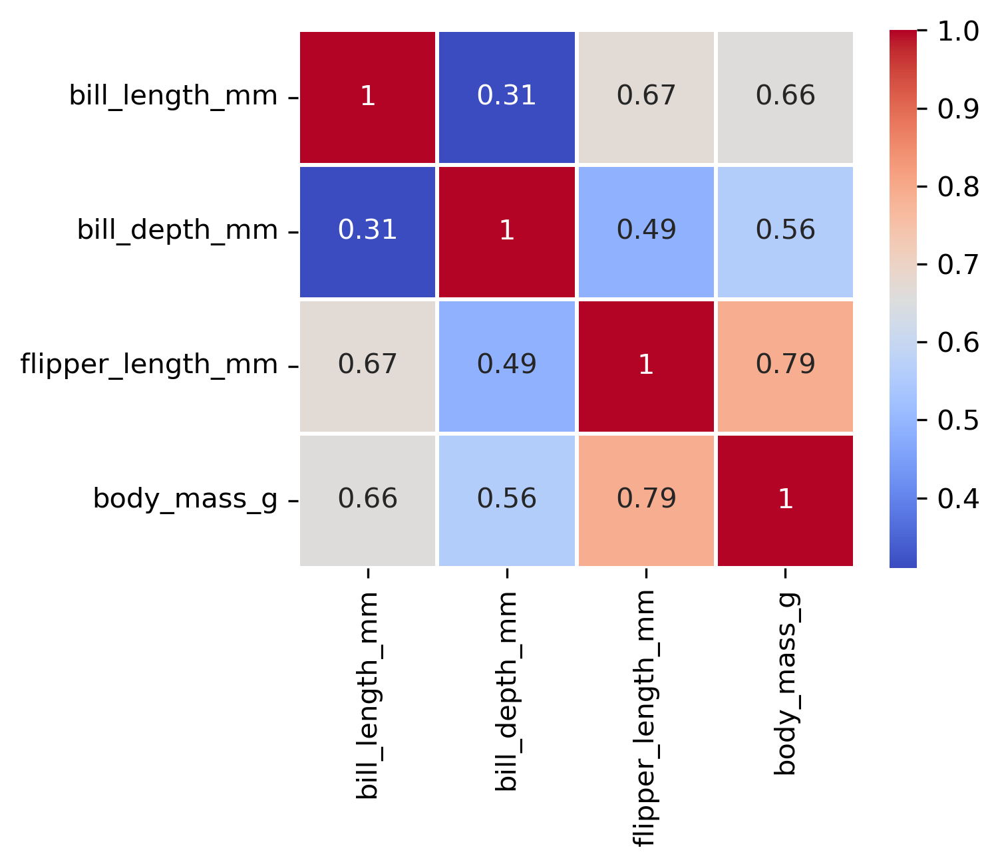

In [13]:
selected_columns = df[['bill_length_mm', 'bill_depth_mm', 'flipper_length_mm', 'body_mass_g']]
correlation_matrix = selected_columns.corr().round(2)

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidth=1)
plt.show()

The correlation matrix provides a quantified relationship between the continuous variables in the dataset, ranging from -1 to 1. Positive values indicate a positive correlation, whereas negative values suggest an inverse correlation. A value closer to 1 or -1 signifies a stronger correlation.

1. **Bill Length & Flipper Length (`r=0.67`)**: There is a moderately strong positive correlation between bill length and flipper length, suggesting that penguins with longer bills tend to have longer flippers.

2. **Bill Length & Body Mass (`r=0.66`)**: A similar moderately strong positive correlation is observed between bill length and body mass, indicating that larger penguins generally have longer bills.

3. **Flipper Length & Body Mass (`r=0.79`)**: A strong positive correlation is present, indicating that flipper length is a good predictor of body mass or vice versa.

4. **Bill Depth & Body Mass (`r=0.56`)**: There's a moderate positive correlation between bill depth and body mass, which suggests that penguins with deeper bills are likely to have higher body mass, although not as strongly correlated as flipper length and body mass.

5. **Bill Length & Bill Depth (`r=0.31`)**: There is a weak positive correlation, which implies that they are somewhat related but not significantly.

6. **Bill Depth & Flipper Length (`r=0.49`)**: A moderate positive correlation exists, suggesting that deeper bills are somewhat associated with longer flippers, but other factors could be at play.

In summary, flipper length shows the strongest correlations with other variables, particularly with body mass, making it a valuable metric for predicting a penguin's physical characteristics. On the other hand, bill length and bill depth show moderate to weak correlations with other features, suggesting that they capture different aspects of penguin morphology.


#  Cramers' V

In [14]:
from scipy.stats import chi2_contingency
cat_cols = ['species','sex','diet','life_stage', 'health_metrics']
cramers_df = pd.DataFrame(index=cat_cols, columns=cat_cols)

def cramers_v(x, y):
    contingency = pd.crosstab(x, y)
    chi2 = chi2_contingency(contingency)[0]
    n = len(x)
    return np.sqrt(chi2 / (n * (min(contingency.shape) - 1)))

for col1 in cat_cols:
    for col2 in cat_cols:
        cramers_df.loc[col1, col2] = cramers_v(df[col1], df[col2]).round(2)

print(cramers_df)

               species   sex  diet life_stage health_metrics
species            1.0  0.04  0.14       0.04            0.1
sex               0.04   1.0  0.03       0.02           0.06
diet              0.14  0.03   1.0       0.73            0.5
life_stage        0.04  0.02  0.73        1.0           0.18
health_metrics     0.1  0.06   0.5       0.18            1.0



The Cramer's V table provides us with a measure of association between the different categorical variables in the dataset. The value ranges from 0 to 1, where 0 indicates no association, and 1 indicates a perfect association.

1. **Species & Other Variables**: Species show little to no association with any other variables, except diet (`V=0.14`), which suggests a low level of correlation.
   
2. **Sex & Other Variables**: The sex of the penguins also shows negligible association with all other variables, making it relatively independent.

3. **Diet & Life Stage**: A strong association is observed between diet and life stage (`V=0.73`), indicating that the life stage of a penguin is highly dependent on its diet or vice versa.

4. **Diet & Health Metrics**: There is a moderate association between diet and health metrics (`V=0.5`), implying that diet does play a role in determining the health of the penguins but isn't the only factor.

5. **Life Stage & Health Metrics**: A weak association is present between life stage and health metrics (`V=0.18`), suggesting other factors are more crucial in determining the penguins' health metrics.

6. **Health Metrics & Other Variables**: While there is a moderate association with diet, health metrics show a weak association with other variables like species, sex, and life stage.

In summary, the most critical insight is the strong correlation between diet and life stage, implying a crucial biological or ecological link. Most other variables are relatively independent of each other, suggesting that each captures different aspects of penguin biology and ecology.

![Imgur](https://i.imgur.com/yzroo3h.png)